In [1]:
## R code 4.1
pos <- replicate( 1000 , sum( runif(16,-1,1) ) )

In [2]:
## R code 4.2
prod( 1 + runif(12,0,0.1) )

[1] 1.819084

In [3]:
## R code 4.3
growth <- replicate( 10000 , prod( 1 + runif(12,0,0.1) ) )
dens( growth , norm.comp=TRUE )

ERROR: Error in eval(expr, envir, enclos): could not find function "dens"


In [4]:
## R code 4.4
big <- replicate( 10000 , prod( 1 + runif(12,0,0.5) ) )
small <- replicate( 10000 , prod( 1 + runif(12,0,0.01) ) )

In [5]:
## R code 4.5
log.big <- replicate( 10000 , log(prod(1 + runif(12,0,0.5))) )

In [6]:
## R code 4.6
w <- 6; n <- 9;
p_grid <- seq(from=0,to=1,length.out=100)
posterior <- dbinom(w,n,p_grid)*dunif(p_grid,0,1)
posterior <- posterior/sum(posterior)

In [7]:
## R code 4.7
library(rethinking)
data(Howell1)
d <- Howell1

Loading required package: rstan
Loading required package: ggplot2
rstan (Version 2.9.0, packaged: 2016-01-05 16:17:47 UTC, GitRev: 05c3d0058b6a)
For execution on a local, multicore CPU with excess RAM we recommend calling
rstan_options(auto_write = TRUE)
options(mc.cores = parallel::detectCores())
Loading required package: parallel
rethinking (Version 1.58)


In [8]:
## R code 4.8
str( d )

'data.frame':	544 obs. of  4 variables:
 $ height: num  152 140 137 157 145 ...
 $ weight: num  47.8 36.5 31.9 53 41.3 ...
 $ age   : num  63 63 65 41 51 35 32 27 19 54 ...
 $ male  : int  1 0 0 1 0 1 0 1 0 1 ...


In [9]:
## R code 4.9
d$height

[1] 151.7650 139.7000 136.5250 156.8450 145.4150 163.8300 149.2250 168.9100
  [9] 147.9550 165.1000 154.3050 151.1300 144.7800 149.9000 150.4950 163.1950
 [17] 157.4800 143.9418 121.9200 105.4100  86.3600 161.2900 156.2100 129.5400
 [25] 109.2200 146.4000 148.5900 147.3200 137.1600 125.7300 114.3000 147.9550
 [33] 161.9250 146.0500 146.0500 152.7048 142.8750 142.8750 147.9550 160.6550
 [41] 151.7650 162.8648 171.4500 147.3200 147.9550 144.7800 121.9200 128.9050
 [49]  97.7900 154.3050 143.5100 146.7000 157.4800 127.0000 110.4900  97.7900
 [57] 165.7350 152.4000 141.6050 158.8000 155.5750 164.4650 151.7650 161.2900
 [65] 154.3050 145.4150 145.4150 152.4000 163.8300 144.1450 129.5400 129.5400
 [73] 153.6700 142.8750 146.0500 167.0050 158.4198  91.4400 165.7350 149.8600
 [81] 147.9550 137.7950 154.9400 160.9598 161.9250 147.9550 113.6650 159.3850
 [89] 148.5900 136.5250 158.1150 144.7800 156.8450 179.0700 118.7450 170.1800
 [97] 146.0500 147.3200 113.0300 162.5600 133.9850 152.4000 160.0200 149.8600
[105] 142.8750 167.0050 159.3850 154.9400 148.5900 111.1250 111.7600 162.5600
[113] 152.4000 124.4600 111.7600  86.3600 170.1800 146.0500 159.3850 151.1300
[121] 160.6550 169.5450 158.7500  74.2950 149.8600 153.0350  96.5200 161.9250
[129] 162.5600 149.2250 116.8400 100.0760 163.1950 161.9250 145.4150 163.1950
[137] 151.1300 150.4950 141.6050 170.8150  91.4400 157.4800 152.4000 149.2250
[145] 129.5400 147.3200 145.4150 121.9200 113.6650 157.4800 154.3050 120.6500
[153] 115.6000 167.0050 142.8750 152.4000  96.5200 160.0000 159.3850 149.8600
[161] 160.6550 160.6550 149.2250 125.0950 140.9700 154.9400 141.6050 160.0200
[169] 150.1648 155.5750 103.5050  94.6150 156.2100 153.0350 167.0050 149.8600
[177] 147.9550 159.3850 161.9250 155.5750 159.3850 146.6850 172.7200 166.3700
[185] 141.6050 142.8750 133.3500 127.6350 119.3800 151.7650 156.8450 148.5900
[193] 157.4800 149.8600 147.9550 102.2350 153.0350 160.6550 149.2250 114.3000
[201] 100.9650 138.4300  91.4400 162.5600 149.2250 158.7500 149.8600 158.1150
[209] 156.2100 148.5900 143.5100 154.3050 131.4450 157.4800 157.4800 154.3050
[217] 107.9500 168.2750 145.4150 147.9550 100.9650 113.0300 149.2250 154.9400
[225] 162.5600 156.8450 123.1900 161.0106 144.7800 143.5100 149.2250 110.4900
[233] 149.8600 165.7350 144.1450 157.4800 154.3050 163.8300 156.2100 153.6700
[241] 134.6200 144.1450 114.3000 162.5600 146.0500 120.6500 154.9400 144.7800
[249] 106.6800 146.6850 152.4000 163.8300 165.7350 156.2100 152.4000 140.3350
[257] 158.1150 163.1950 151.1300 171.1198 149.8600 163.8300 141.6050  93.9800
[265] 149.2250 105.4100 146.0500 161.2900 162.5600 145.4150 145.4150 170.8150
[273] 127.0000 159.3850 159.4000 153.6700 160.0200 150.4950 149.2250 127.0000
[281] 142.8750 142.1130 147.3200 162.5600 164.4650 160.0200 153.6700 167.0050
[289] 151.1300 147.9550 125.3998 111.1250 153.0350 139.0650 152.4000 154.9400
[297] 147.9550 143.5100 117.9830 144.1450  92.7100 147.9550 155.5750 150.4950
[305] 155.5750 154.3050 130.6068 101.6000 157.4800 168.9100 150.4950 111.7600
[313] 160.0200 167.6400 144.1450 145.4150 160.0200 147.3200 164.4650 153.0350
[321] 149.2250 160.0200 149.2250  85.0900  84.4550  59.6138  92.7100 111.1250
[329]  90.8050 153.6700  99.6950  62.4840  81.9150  96.5200  80.0100 150.4950
[337] 151.7650 140.6398  88.2650 158.1150 149.2250 151.7650 154.9400 123.8250
[345] 104.1400 161.2900 148.5900  97.1550  93.3450 160.6550 157.4800 167.0050
[353] 157.4800  91.4400  60.4520 137.1600 152.4000 152.4000  81.2800 109.2200
[361]  71.1200  89.2048  67.3100  85.0900  69.8500 161.9250 152.4000  88.9000
[369]  90.1700  71.7550  83.8200 159.3850 142.2400 142.2400 168.9100 123.1900
[377]  74.9300  74.2950  90.8050 160.0200  67.9450 135.8900 158.1150  85.0900
[385]  93.3450 152.4000 155.5750 154.3050 156.8450 120.0150 114.3000  83.8200
[393] 156.2100 137.1600 114.3000  93.9800 168.2750 147.9550 139.7000 157.4800
[401]  76.2000  66.0400 160.7000 114.3000 146.0500 161.2900  69.8500 133.9850
[409]  67.9450 150.4950 

In [10]:
## R code 4.10
d2 <- d[ d$age >= 18 , ]

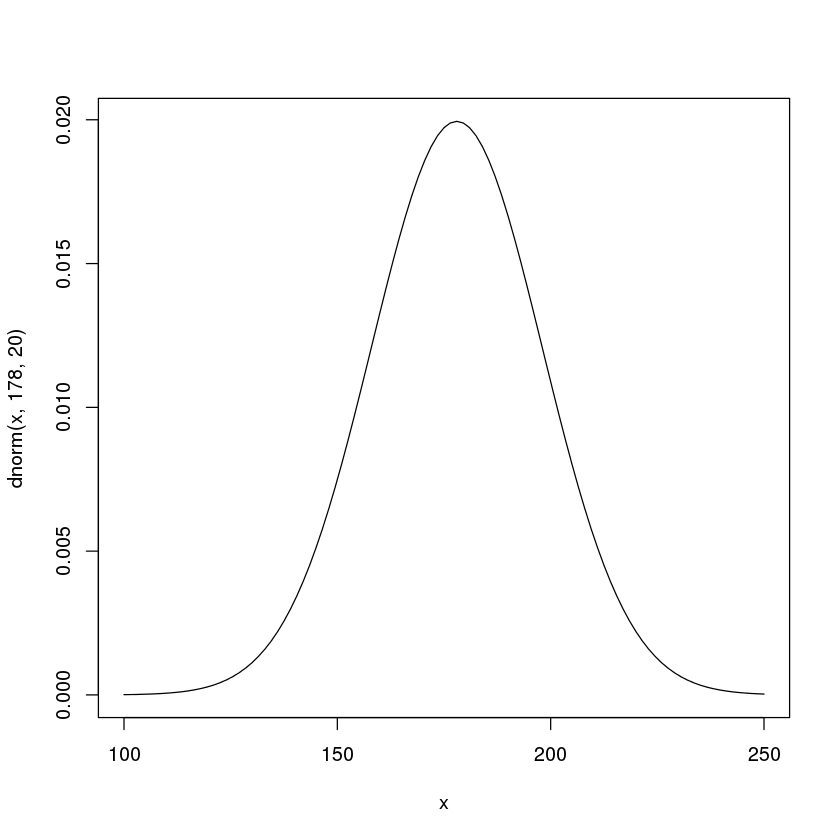

In [11]:
## R code 4.11
curve( dnorm( x , 178 , 20 ) , from=100 , to=250 )

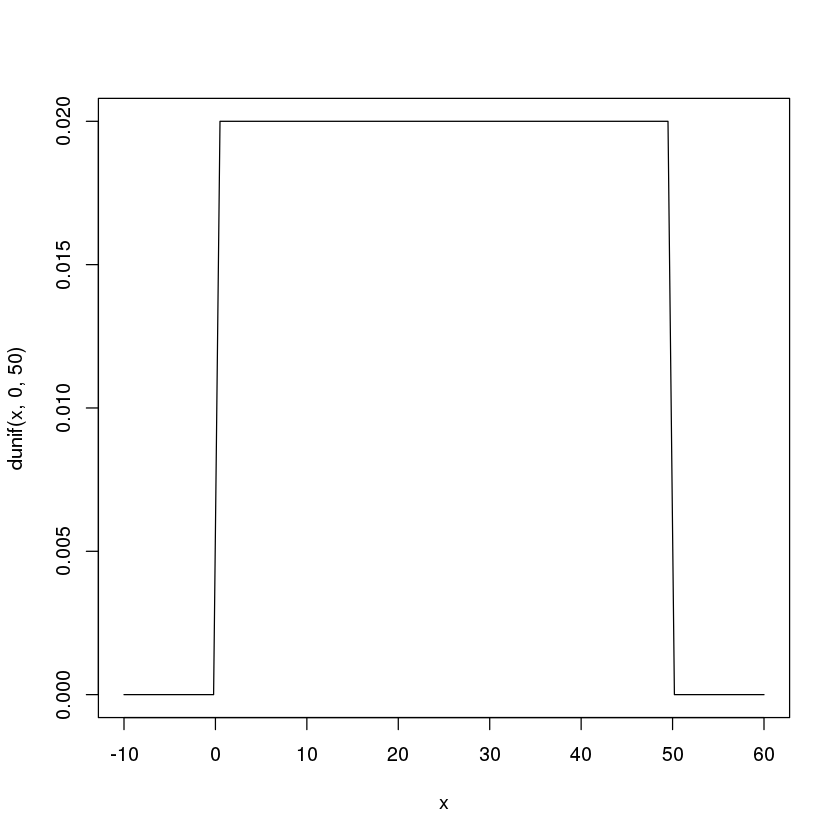

In [12]:
## R code 4.12
curve( dunif( x , 0 , 50 ) , from=-10 , to=60 )

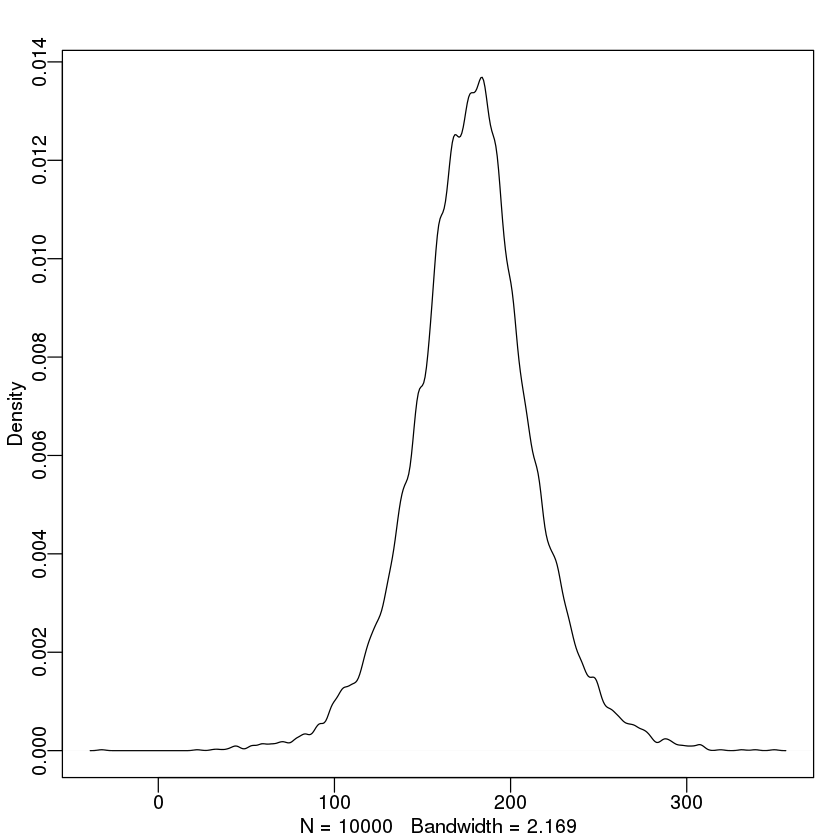

In [13]:
## R code 4.13
sample_mu <- rnorm( 1e4 , 178 , 20 )
sample_sigma <- runif( 1e4 , 0 , 50 )
prior_h <- rnorm( 1e4 , sample_mu , sample_sigma )
dens( prior_h )

In [14]:
## R code 4.14
mu.list <- seq( from=140, to=160 , length.out=200 )
sigma.list <- seq( from=4 , to=9 , length.out=200 )
post <- expand.grid( mu=mu.list , sigma=sigma.list )
post$LL <- sapply( 1:nrow(post) , function(i) sum( dnorm(
                d2$height ,
                mean=post$mu[i] ,
                sd=post$sigma[i] ,
                log=TRUE ) ) )
post$prod <- post$LL + dnorm( post$mu , 178 , 20 , TRUE ) +
    dunif( post$sigma , 0 , 50 , TRUE )
post$prob <- exp( post$prod - max(post$prod) )

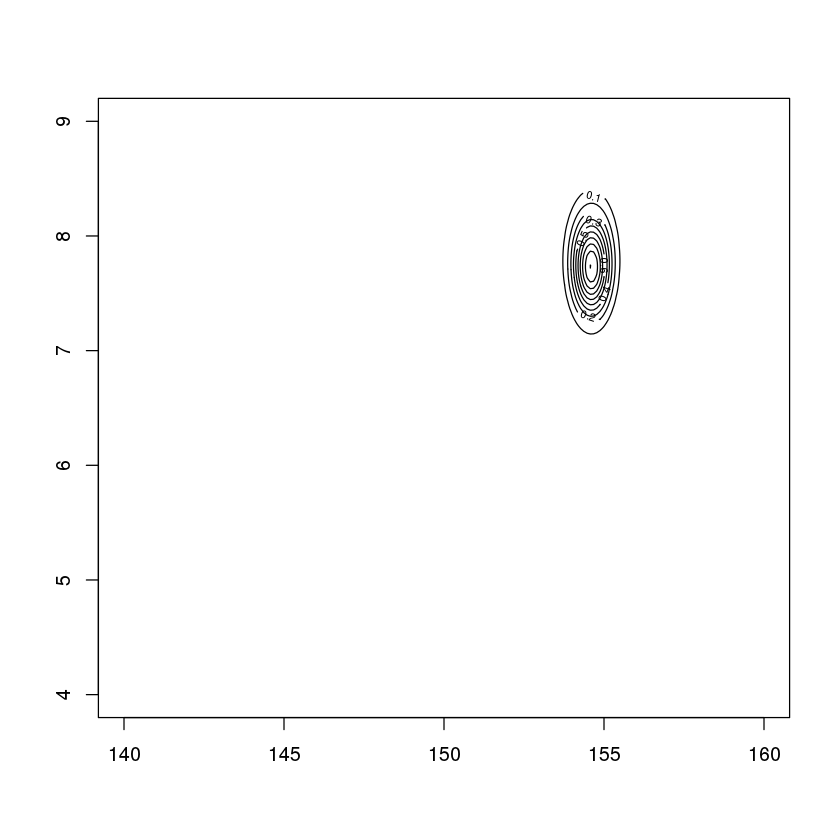

In [15]:
## R code 4.15
contour_xyz( post$mu , post$sigma , post$prob )

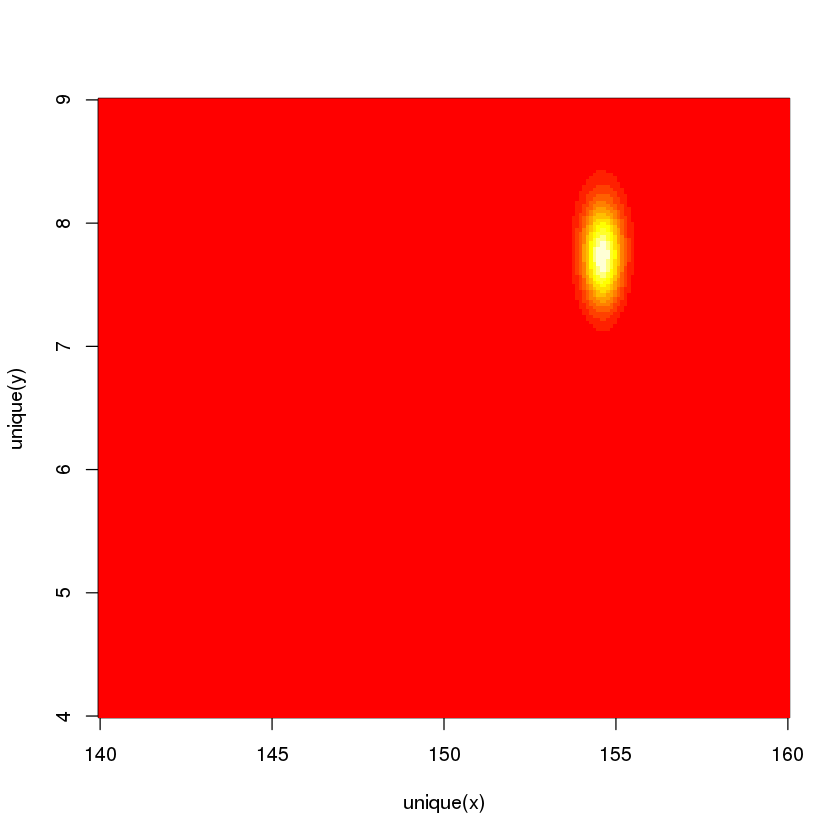

In [16]:
## R code 4.16
image_xyz( post$mu , post$sigma , post$prob )

In [17]:
## R code 4.17
sample.rows <- sample( 1:nrow(post) , size=1e4 , replace=TRUE ,
    prob=post$prob )
sample.mu <- post$mu[ sample.rows ]
sample.sigma <- post$sigma[ sample.rows ]

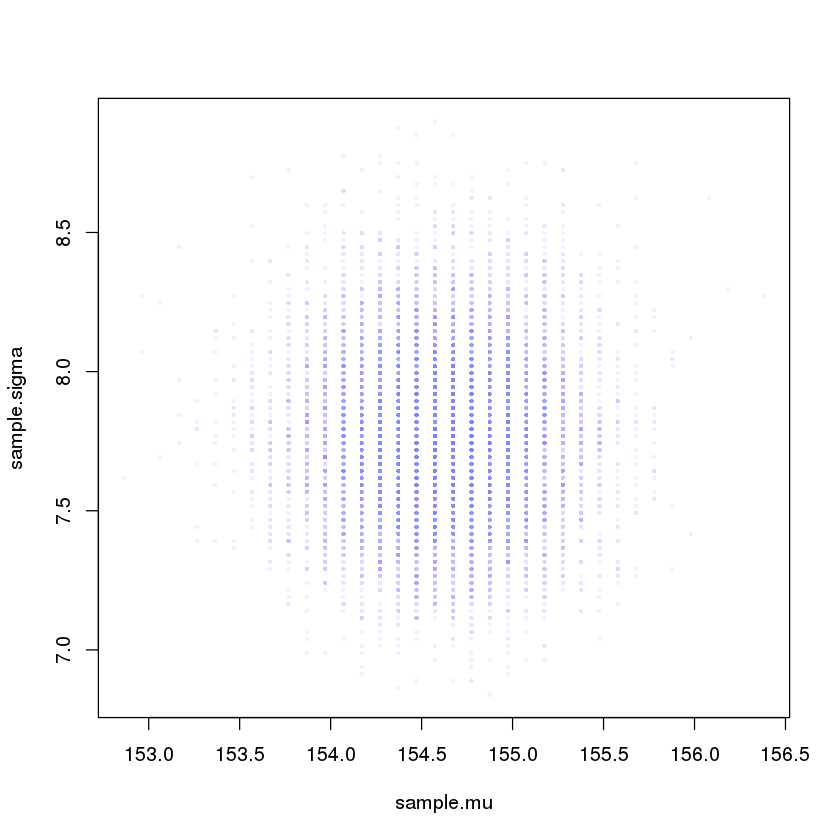

In [18]:
## R code 4.18
plot( sample.mu , sample.sigma , cex=0.5 , pch=16 , col=col.alpha(rangi2,0.1) )

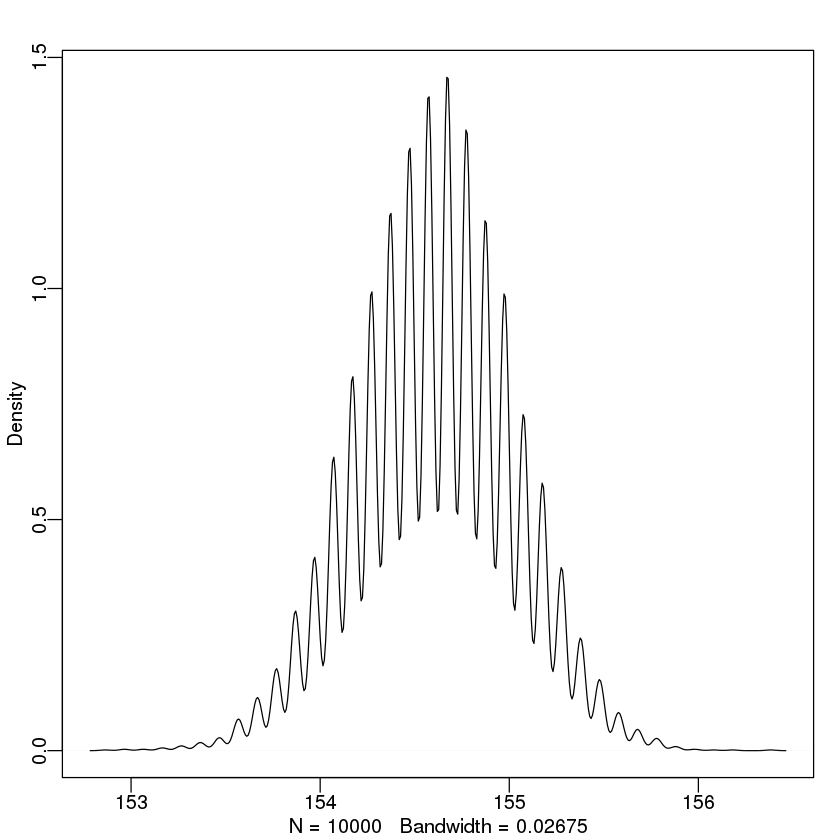

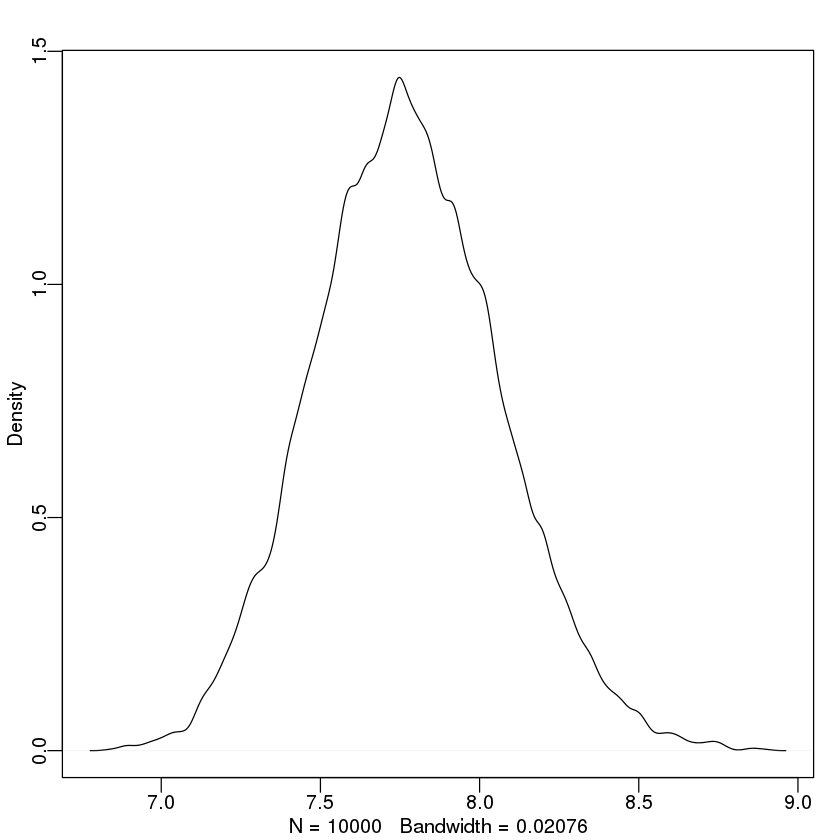

In [19]:
## R code 4.19
dens( sample.mu )
dens( sample.sigma )

In [20]:
## R code 4.20
HPDI( sample.mu )
HPDI( sample.sigma )

|0.89    0.89| 
153.8693 155.1759

|0.89    0.89| 
7.266332 8.195980

In [21]:
## R code 4.21
d3 <- sample( d2$height , size=20 )

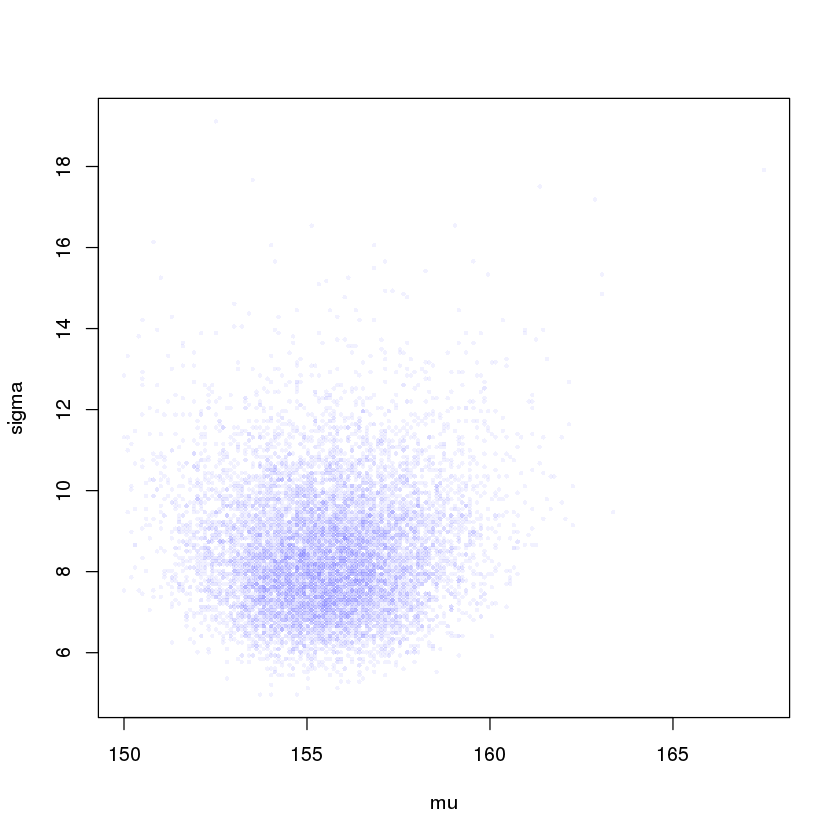

In [22]:
## R code 4.22
mu.list <- seq( from=150, to=170 , length.out=200 )
sigma.list <- seq( from=4 , to=20 , length.out=200 )
post2 <- expand.grid( mu=mu.list , sigma=sigma.list )
post2$LL <- sapply( 1:nrow(post2) , function(i)
    sum( dnorm( d3 , mean=post2$mu[i] , sd=post2$sigma[i] ,
    log=TRUE ) ) )
post2$prod <- post2$LL + dnorm( post2$mu , 178 , 20 , TRUE ) +
    dunif( post2$sigma , 0 , 50 , TRUE )
post2$prob <- exp( post2$prod - max(post2$prod) )
sample2.rows <- sample( 1:nrow(post2) , size=1e4 , replace=TRUE ,
    prob=post2$prob )
sample2.mu <- post2$mu[ sample2.rows ]
sample2.sigma <- post2$sigma[ sample2.rows ]
plot( sample2.mu , sample2.sigma , cex=0.5 ,
    col=col.alpha(rangi2,0.1) ,
    xlab="mu" , ylab="sigma" , pch=16 )

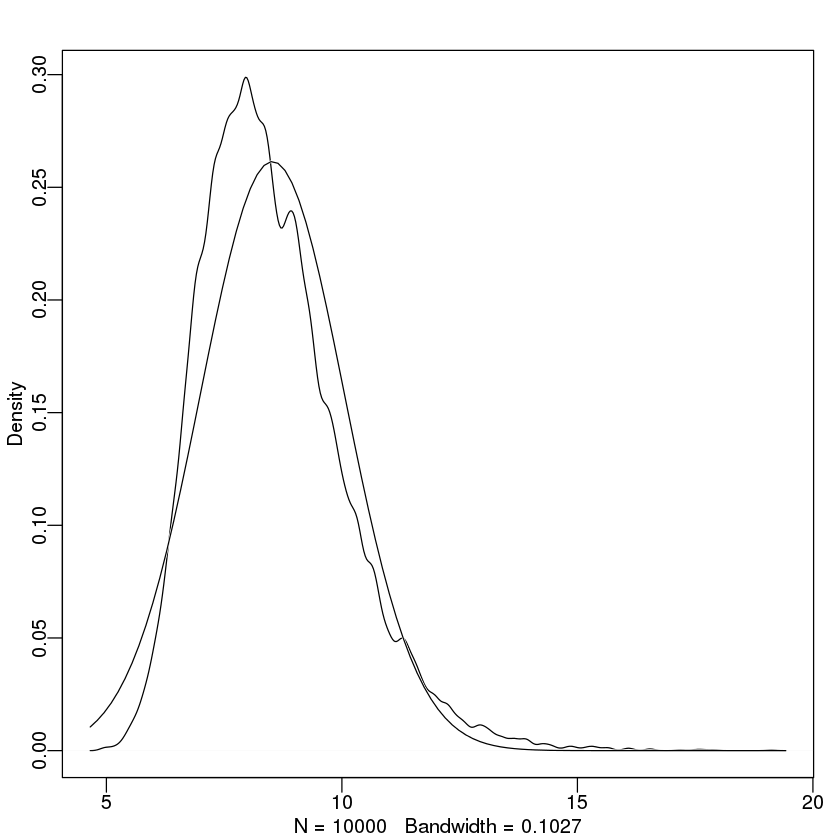

In [23]:
## R code 4.23
dens( sample2.sigma , norm.comp=TRUE )

In [24]:
## R code 4.24
library(rethinking)
data(Howell1)
d <- Howell1
d2 <- d[ d$age >= 18 , ]

In [25]:
## R code 4.25
flist <- alist(
    height ~ dnorm( mu , sigma ) ,
    mu ~ dnorm( 178 , 20 ) ,
    sigma ~ dunif( 0 , 50 )
)

In [26]:
## R code 4.26
m4.1 <- map( flist , data=d2 )

In [27]:
## R code 4.27
precis( m4.1 )

        Mean StdDev   5.5%  94.5%
mu    154.61   0.41 153.95 155.27
sigma   7.73   0.29   7.27   8.20

In [28]:
## R code 4.28
start <- list(
    mu=mean(d2$height),
    sigma=sd(d2$height)
)

In [29]:
## R code 4.29
m4.2 <- map(
        alist(
            height ~ dnorm( mu , sigma ) ,
            mu ~ dnorm( 178 , 0.1 ) ,
            sigma ~ dunif( 0 , 50 )
        ) ,
        data=d2 )
precis( m4.2 )

        Mean StdDev   5.5%  94.5%
mu    177.86   0.10 177.70 178.02
sigma  24.52   0.93  23.04  26.00

In [30]:
## R code 4.30
vcov( m4.1 )

,mu,sigma
mu,0.1697378966,0.0002174685
sigma,0.0002174685,0.0849036799


In [31]:
## R code 4.31
diag( vcov( m4.1 ) )
cov2cor( vcov( m4.1 ) )

mu      sigma 
0.16973790 0.08490368

,mu,sigma
mu,1.000000000,0.001811522
sigma,0.001811522,1.000000000


In [32]:
## R code 4.32
library(rethinking)
post <- extract.samples( m4.1 , n=1e4 )
head(post)

,mu,sigma
1,154.7303,7.344851
2,154.3368,7.512783
3,154.5159,7.760529
4,154.4159,7.667103
5,154.508,7.748137
6,154.2402,7.473034


In [33]:
## R code 4.33
precis(post)

        Mean StdDev  |0.89  0.89|
mu    154.60   0.41 153.93 155.25
sigma   7.73   0.29   7.27   8.19

In [34]:
## R code 4.34
library(MASS)
post <- mvrnorm( n=1e4 , mu=coef(m4.1) , Sigma=vcov(m4.1) )

In [35]:
## R code 4.35
m4.1_logsigma <- map(
        alist(
            height ~ dnorm( mu , exp(log_sigma) ) ,
            mu ~ dnorm( 178 , 20 ) ,
            log_sigma ~ dnorm( 2 , 10 )
        ) , data=d2 )

In [36]:
## R code 4.36
post <- extract.samples( m4.1_logsigma )
sigma <- exp( post$log_sigma )

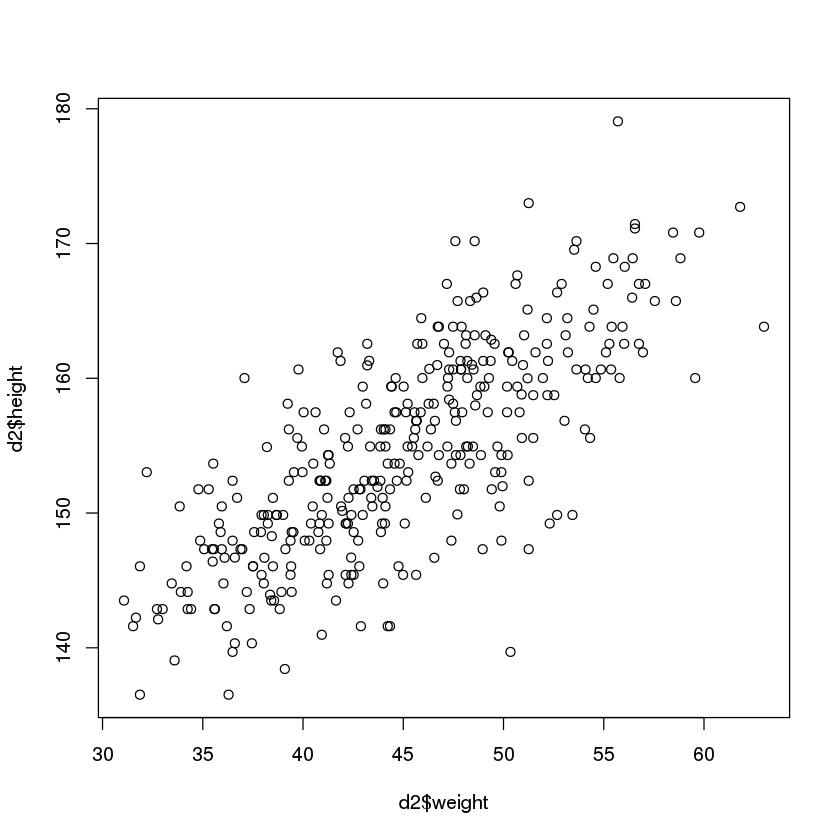

In [37]:
## R code 4.37
plot( d2$height ~ d2$weight )

In [38]:
## R code 4.38
# load data again, since it's a long way back
library(rethinking)
data(Howell1)
d <- Howell1
d2 <- d[ d$age >= 18 , ]

# fit model
m4.3 <- map(
    alist(
        height ~ dnorm( mu , sigma ) ,
        mu <- a + b*weight ,
        a ~ dnorm( 156 , 100 ) ,
        b ~ dnorm( 0 , 10 ) ,
        sigma ~ dunif( 0 , 50 )
    ) ,
    data=d2 )

In [39]:
## R code 4.39
m4.3 <- map(
    alist(
        height ~ dnorm( a + b*weight , sigma ) ,
        a ~ dnorm( 178 , 100 ) ,
        b ~ dnorm( 0 , 10 ) ,
        sigma ~ dunif( 0 , 50 )
    ) ,
    data=d2 )

In [40]:
## R code 4.40
precis( m4.3 )

        Mean StdDev   5.5%  94.5%
a     113.91   1.91 110.86 116.95
b       0.90   0.04   0.84   0.97
sigma   5.07   0.19   4.77   5.38

In [41]:
## R code 4.41
precis( m4.3 , corr=TRUE )

        Mean StdDev   5.5%  94.5%     a     b sigma
a     113.91   1.91 110.86 116.95  1.00 -0.99     0
b       0.90   0.04   0.84   0.97 -0.99  1.00     0
sigma   5.07   0.19   4.77   5.38  0.00  0.00     1

In [42]:
## R code 4.42
d2$weight.c <- d2$weight - mean(d2$weight)

In [43]:
## R code 4.43
m4.4 <- map(
    alist(
        height ~ dnorm( mu , sigma ) ,
        mu <- a + b*weight.c ,
        a ~ dnorm( 178 , 100 ) ,
        b ~ dnorm( 0 , 10 ) ,
        sigma ~ dunif( 0 , 50 )
    ) ,
    data=d2 )

In [44]:
## R code 4.44
precis( m4.4 , corr=TRUE )

        Mean StdDev   5.5%  94.5% a b sigma
a     154.60   0.27 154.17 155.03 1 0     0
b       0.91   0.04   0.84   0.97 0 1     0
sigma   5.07   0.19   4.77   5.38 0 0     1

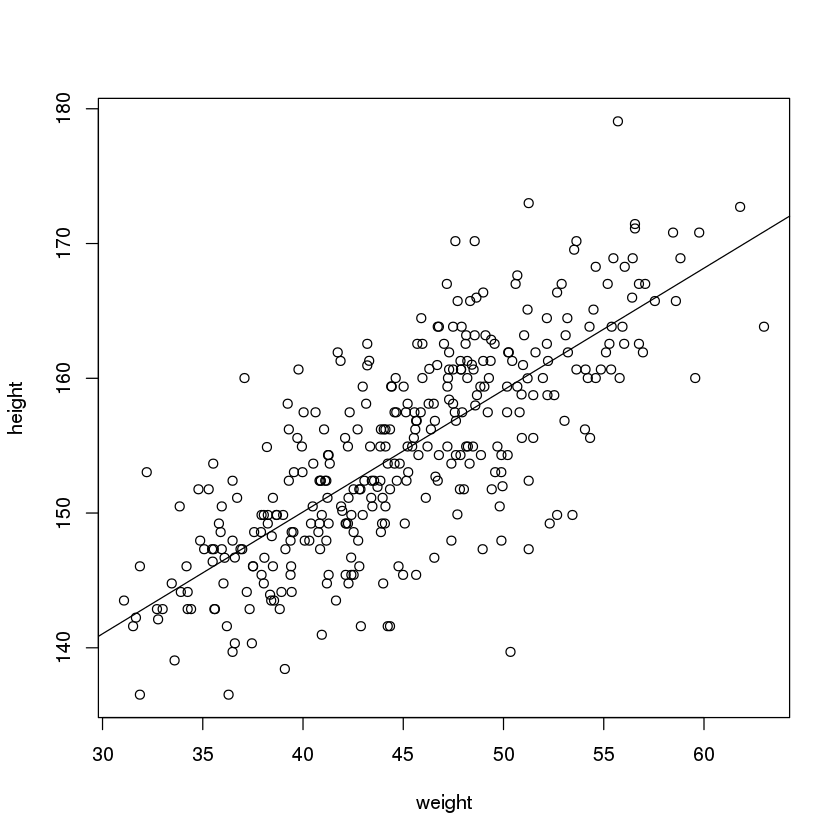

In [45]:
## R code 4.45
plot( height ~ weight , data=d2 )
abline( a=coef(m4.3)["a"] , b=coef(m4.3)["b"] )

In [46]:
## R code 4.46
post <- extract.samples( m4.3 )

In [47]:
## R code 4.47
post[1:5,]

,a,b,sigma
1,114.8846,0.8817769,5.219599
2,114.1036,0.8934015,5.032628
3,117.5865,0.8223246,4.968065
4,113.6238,0.9040638,5.062998
5,113.5487,0.9165291,5.253595


In [48]:
## R code 4.48
N <- 10
dN <- d2[ 1:N , ]
mN <- map(
    alist(
        height ~ dnorm( mu , sigma ) ,
        mu <- a + b*weight ,
        a ~ dnorm( 178 , 100 ) ,
        b ~ dnorm( 0 , 10 ) ,
        sigma ~ dunif( 0 , 50 )
    ) , data=dN )

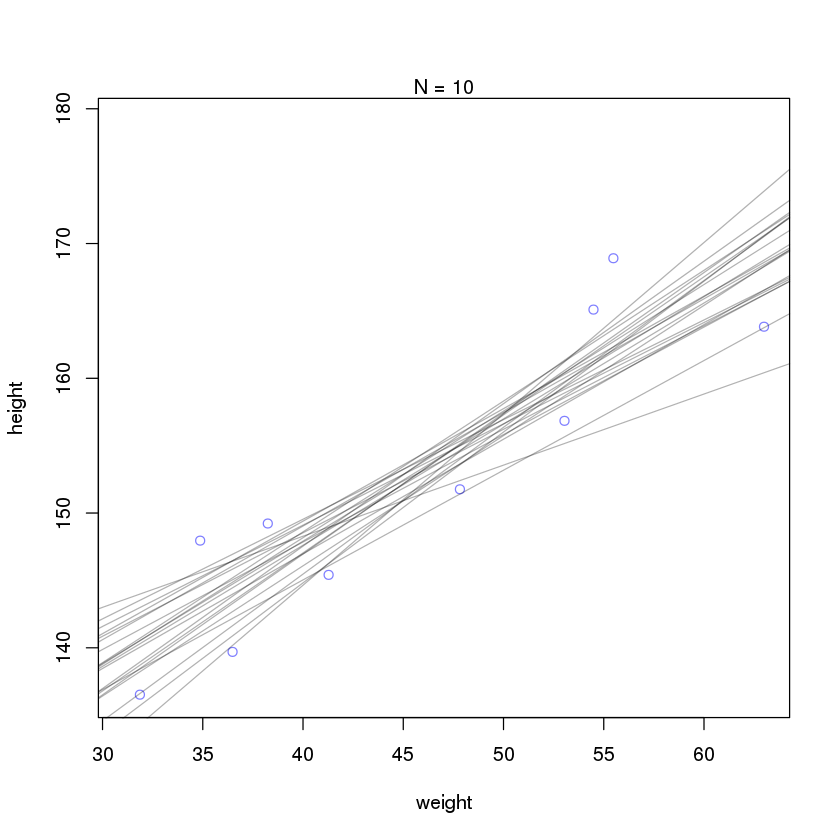

In [49]:
## R code 4.49
# extract 20 samples from the posterior
post <- extract.samples( mN , n=20 )

# display raw data and sample size
plot( dN$weight , dN$height ,
    xlim=range(d2$weight) , ylim=range(d2$height) ,
    col=rangi2 , xlab="weight" , ylab="height" )
mtext(concat("N = ",N))

# plot the lines, with transparency
for ( i in 1:20 )
    abline( a=post$a[i] , b=post$b[i] , col=col.alpha("black",0.3) )

In [50]:
## R code 4.50
mu_at_50 <- post$a + post$b * 50

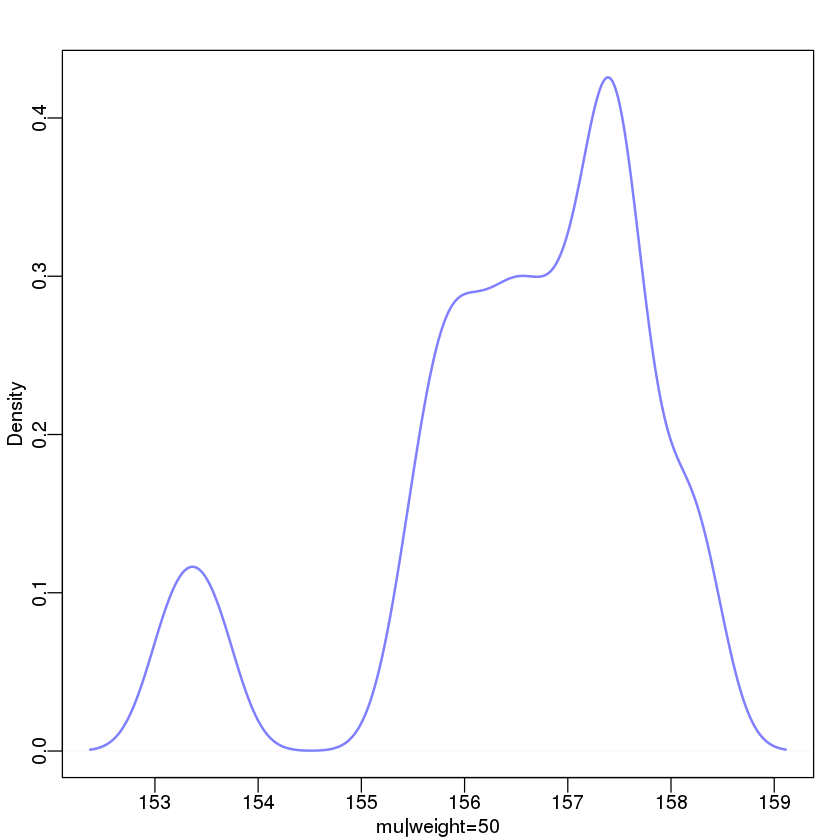

In [51]:
## R code 4.51
dens( mu_at_50 , col=rangi2 , lwd=2 , xlab="mu|weight=50" )

In [52]:
## R code 4.52
HPDI( mu_at_50 , prob=0.89 )

|0.89    0.89| 
153.5529 158.3080

In [53]:
## R code 4.53
mu <- link( m4.3 )
str(mu)

[ 1000 / 1000 ]
 num [1:1000, 1:352] 42.9 45.2 46.7 44.1 43.3 ...


In [54]:
## R code 4.54
# define sequence of weights to compute predictions for
# these values will be on the horizontal axis
weight.seq <- seq( from=25 , to=70 , by=1 )

# use link to compute mu
# for each sample from posterior
# and for each weight in weight.seq
mu <- link( m4.3 , data=data.frame(weight=weight.seq) )
str(mu)

[ 1000 / 1000 ]
 num [1:1000, 1:46] 23.6 20.6 22.6 24.3 23 ...


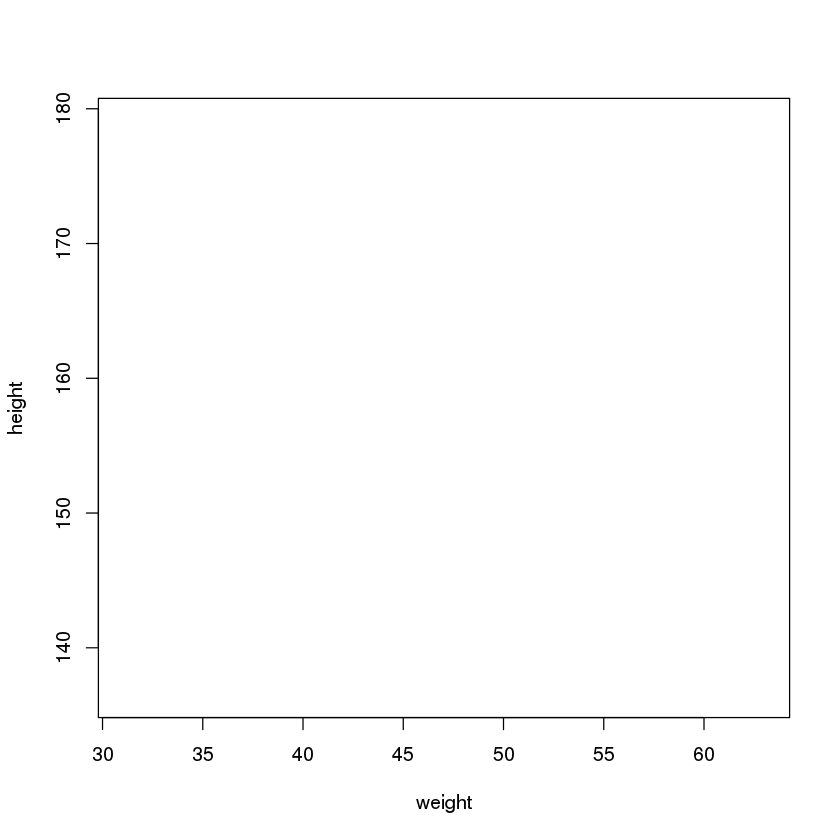

In [55]:
## R code 4.55
# use type="n" to hide raw data
plot( height ~ weight , d2 , type="n" )

# loop over samples and plot each mu value
for ( i in 1:100 )
    points( weight.seq , mu[i,] , pch=16 , col=col.alpha(rangi2,0.1) )

In [56]:
## R code 4.56
# summarize the distribution of mu
mu.mean <- apply( mu , 2 , mean )
mu.HPDI <- apply( mu , 2 , HPDI , prob=0.89 )

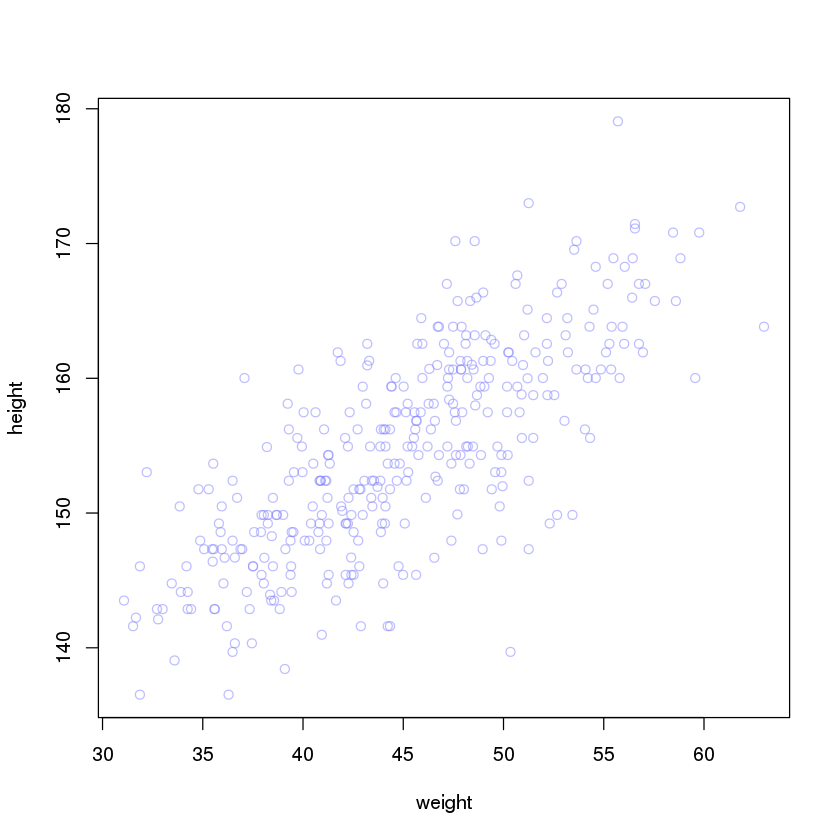

In [57]:
## R code 4.57
# plot raw data
# fading out points to make line and interval more visible
plot( height ~ weight , data=d2 , col=col.alpha(rangi2,0.5) )

# plot the MAP line, aka the mean mu for each weight
lines( weight.seq , mu.mean )

# plot a shaded region for 89% HPDI
shade( mu.HPDI , weight.seq )

In [58]:
## R code 4.58
post <- extract.samples(m4.3)
mu.link <- function(weight) post$a + post$b*weight
weight.seq <- seq( from=25 , to=70 , by=1 )
mu <- sapply( weight.seq , mu.link )
mu.mean <- apply( mu , 2 , mean )
mu.HPDI <- apply( mu , 2 , HPDI , prob=0.89 )

In [59]:
## R code 4.59
sim.height <- sim( m4.3 , data=list(weight=weight.seq) )
str(sim.height)

[ 1000 / 1000 ]
 num [1:1000, 1:46] 132 141 132 137 129 ...


In [60]:
## R code 4.60
height.PI <- apply( sim.height , 2 , PI , prob=0.89 )

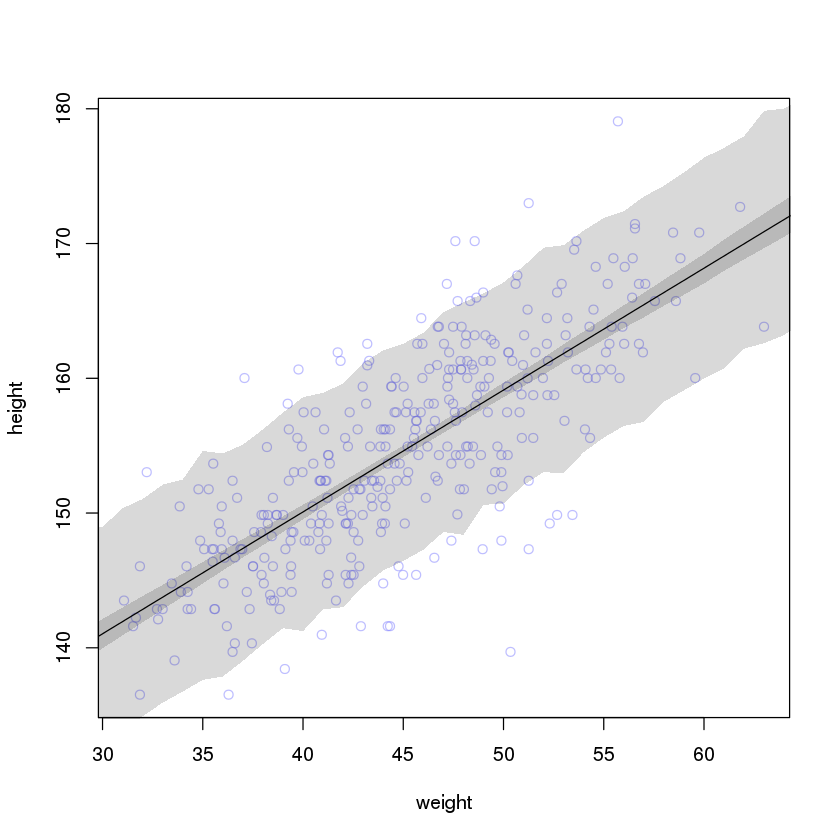

In [61]:
## R code 4.61
# plot raw data
plot( height ~ weight , d2 , col=col.alpha(rangi2,0.5) )

# draw MAP line
lines( weight.seq , mu.mean )

# draw HPDI region for line
shade( mu.HPDI , weight.seq )

# draw PI region for simulated heights
shade( height.PI , weight.seq )

In [62]:
## R code 4.62
sim.height <- sim( m4.3 , data=list(weight=weight.seq) , n=1e4 )
height.PI <- apply( sim.height , 2 , PI , prob=0.89 )

[ 10000 / 10000 ]


In [63]:
## R code 4.63
post <- extract.samples(m4.3)
weight.seq <- 25:70
sim.height <- sapply( weight.seq , function(weight)
    rnorm(
        n=nrow(post) ,
        mean=post$a + post$b*weight ,
        sd=post$sigma ) )
height.PI <- apply( sim.height , 2 , PI , prob=0.89 )

In [64]:
## R code 4.64
library(rethinking)
data(Howell1)
d <- Howell1
str(d)

'data.frame':	544 obs. of  4 variables:
 $ height: num  152 140 137 157 145 ...
 $ weight: num  47.8 36.5 31.9 53 41.3 ...
 $ age   : num  63 63 65 41 51 35 32 27 19 54 ...
 $ male  : int  1 0 0 1 0 1 0 1 0 1 ...


In [65]:
## R code 4.65
d$weight.s <- ( d$weight - mean(d$weight) )/sd(d$weight)

In [66]:
## R code 4.66
d$weight.s2 <- d$weight.s^2
m4.5 <- map(
    alist(
        height ~ dnorm( mu , sigma ) ,
        mu <- a + b1*weight.s + b2*weight.s2 ,
        a ~ dnorm( 178 , 100 ) ,
        b1 ~ dnorm( 0 , 10 ) ,
        b2 ~ dnorm( 0 , 10 ) ,
        sigma ~ dunif( 0 , 50 )
    ) ,
    data=d )

In [67]:
## R code 4.67
precis( m4.5 )

        Mean StdDev   5.5%  94.5%
a     146.66   0.37 146.07 147.26
b1     21.40   0.29  20.94  21.86
b2     -8.42   0.28  -8.87  -7.97
sigma   5.75   0.17   5.47   6.03

In [68]:
## R code 4.68
weight.seq <- seq( from=-2.2 , to=2 , length.out=30 )
pred_dat <- list( weight.s=weight.seq , weight.s2=weight.seq^2 )
mu <- link( m4.5 , data=pred_dat )
mu.mean <- apply( mu , 2 , mean )
mu.PI <- apply( mu , 2 , PI , prob=0.89 )
sim.height <- sim( m4.5 , data=pred_dat )
height.PI <- apply( sim.height , 2 , PI , prob=0.89 )

[ 1000 / 1000 ]
[ 1000 / 1000 ]


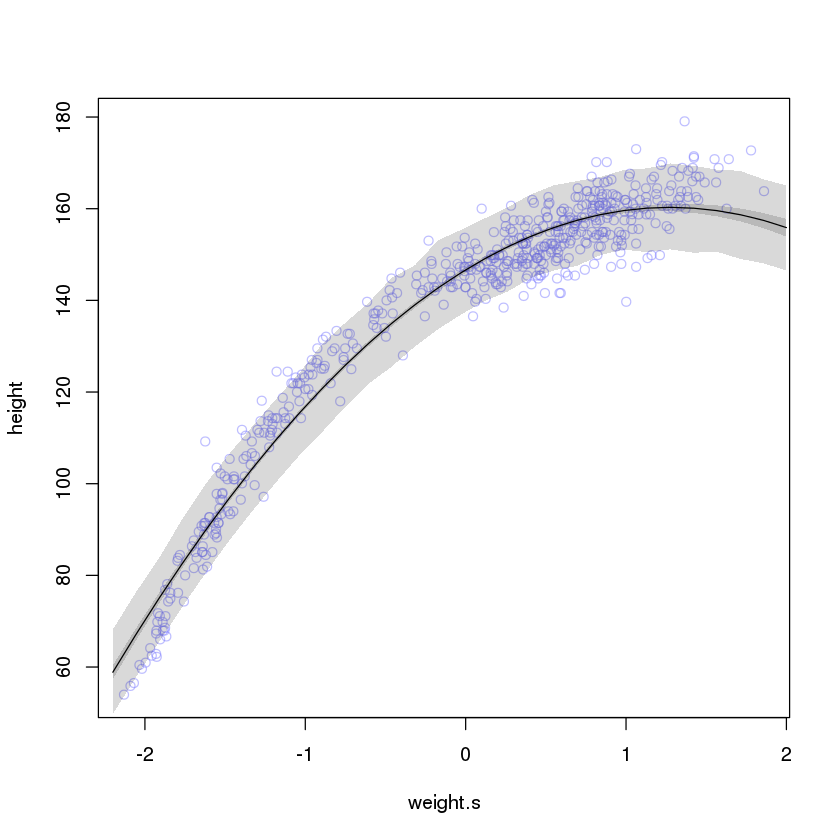

In [69]:
## R code 4.69
plot( height ~ weight.s , d , col=col.alpha(rangi2,0.5) )
lines( weight.seq , mu.mean )
shade( mu.PI , weight.seq )
shade( height.PI , weight.seq )

In [70]:
## R code 4.70
d$weight.s3 <- d$weight.s^3
m4.6 <- map(
    alist(
        height ~ dnorm( mu , sigma ) ,
        mu <- a + b1*weight.s + b2*weight.s2 + b3*weight.s3 ,
        a ~ dnorm( 178 , 100 ) ,
        b1 ~ dnorm( 0 , 10 ) ,
        b2 ~ dnorm( 0 , 10 ) ,
        b3 ~ dnorm( 0 , 10 ) ,
        sigma ~ dunif( 0 , 50 )
    ) ,
    data=d )

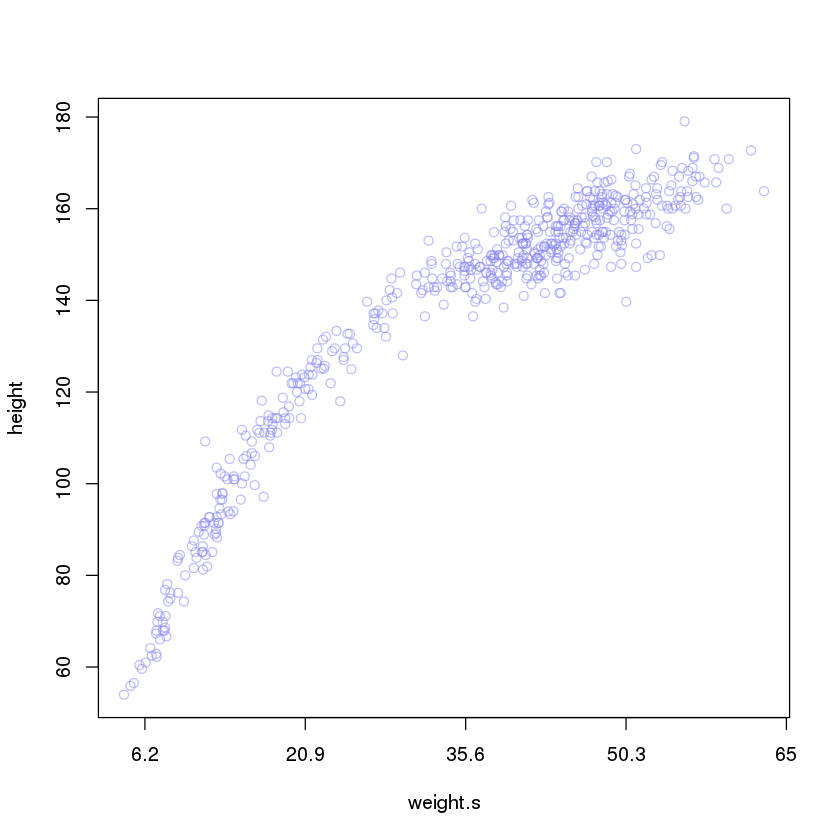

In [71]:
## R code 4.71
plot( height ~ weight.s , d , col=col.alpha(rangi2,0.5) , xaxt="n" )

## R code 4.72
at <- c(-2,-1,0,1,2)
labels <- at*sd(d$weight) + mean(d$weight)
axis( side=1 , at=at , labels=round(labels,1) )

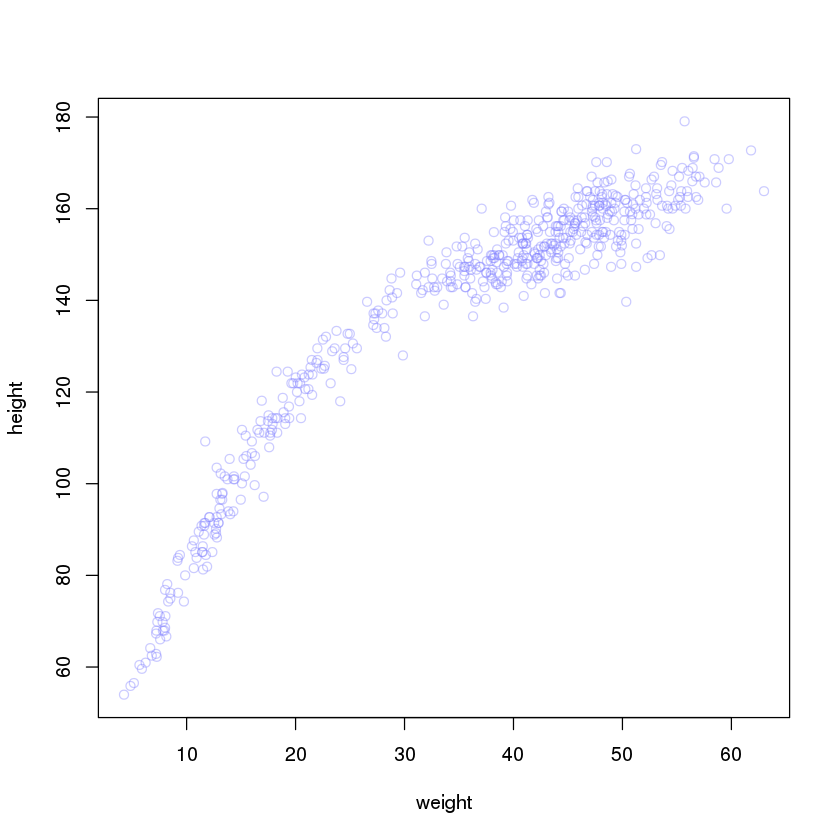

In [72]:
## R code 4.73
plot( height ~ weight , data=Howell1 ,
    col=col.alpha(rangi2,0.4) )